# MDS NK cells

EG54, EG55, EG56, EG57 and EG58 are MDS cases. All samples are from different donors. 

In this notebook aplastic anemia samples are merged together and UMAPs are generated based on RNA, proteins or latent space. Only NK cells are selected based on clustering + marker gene/protein analysis done in "easi_nk_AA_clustering" -notebook. Leiden clusters are calculated from UMAP based on latent space coordinates and highly expressed genes/markers are searched using scanpy rank_genes_groups -function. 

Finally, markers received from HRUH Aplastic anemia presentation (unpublished data) and Melsen et al. paper are visualized. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
def get_cluster_proportions(adata,
                            cluster_key="cluster_final",
                            sample_key="replicate",
                            drop_values=None):
    """
    Input
    =====
    adata : AnnData object
    cluster_key : key of `adata.obs` storing cluster info
    sample_key : key of `adata.obs` storing sample/replicate info
    drop_values : list/iterable of possible values of `sample_key` that you don't want
    
    Returns
    =======
    pd.DataFrame with samples as the index and clusters as the columns and 0-100 floats
    as values
    """
    
    adata_tmp = adata.copy()
    sizes = adata_tmp.obs.groupby([cluster_key, sample_key]).size()
    props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index() 
    props = props.pivot(columns=sample_key, index=cluster_key).T
    props.index = props.index.droplevel(0)
    props.fillna(0, inplace=True)
    
    if drop_values is not None:
        for drop_value in drop_values:
            props.drop(drop_value, axis=0, inplace=True)
    return props


def plot_cluster_proportions(cluster_props, 
                             cluster_palette=None,
                             xlabel_rotation=0): 
    fig, ax = plt.subplots(dpi=300)
    fig.patch.set_facecolor("white")
    
    cmap = None
    if cluster_palette is not None:
        cmap = sns.palettes.blend_palette(
            cluster_palette, 
            n_colors=len(cluster_palette), 
            as_cmap=True)
   
    cluster_props.plot(
        kind="bar", 
        stacked=True, 
        ax=ax, 
        legend=None, 
        colormap=cmap
    )
    
    ax.legend(bbox_to_anchor=(1.01, 1), frameon=False, title="Cluster")
    sns.despine(fig, ax)
    ax.tick_params(axis="x", rotation=xlabel_rotation)
    ax.set_xlabel(cluster_props.index.name.capitalize())
    ax.set_ylabel("Proportion")
    fig.tight_layout()
    
    return fig

In [3]:
#Easigenomics dataset, all AA samples merged

adata = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/MDS_norm.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 13184 × 5031
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot', 'leiden_0.5', 'leiden_0.3', 'leiden_0.2', 'leiden_0.1', 'leiden_0.15', 'leiden_0.18'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_no

In [5]:
#Calculating neighbors for UMAPs

sc.pp.neighbors(adata, use_rep="X_totalVI")    

sc.tl.umap(adata)


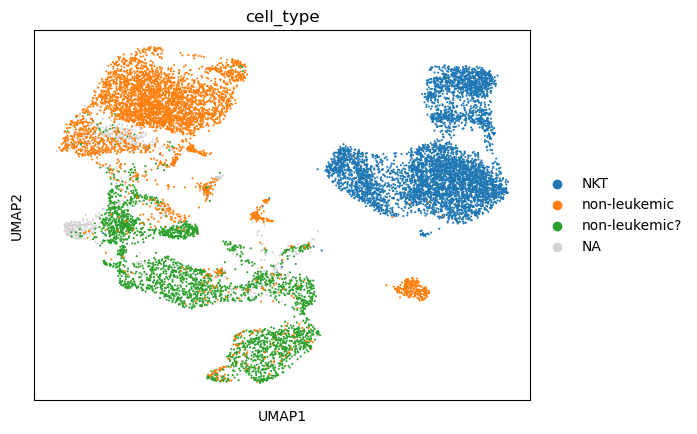

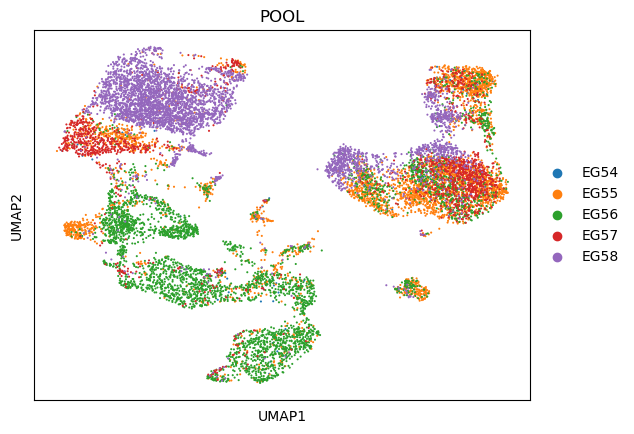

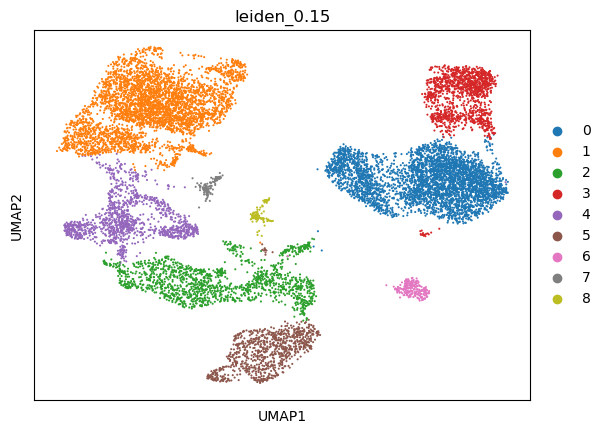

In [6]:
#latent space

sc.pl.umap(adata, color = ['cell_type'], color_map = 'viridis')

sc.pl.umap(adata, color = ['POOL'], color_map = 'viridis')

sc.pl.umap(adata, color = ['leiden_0.15'], color_map = 'viridis')


In [7]:
#selecting only NK cells (=cluster 0), identified in earlier notebook

adata_nk = adata[adata.obs['leiden_0.15'] == "0"]

In [8]:
#Within the NK cell cluster there are cells annotated as "non-leukemic", these cells are removed from analysis 

adata_nk = adata_nk[adata_nk.obs['cell_type'] == "NKT"]

In [9]:
adata_nk

View of AnnData object with n_obs × n_vars = 3943 × 5031
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot', 'leiden_0.5', 'leiden_0.3', 'leiden_0.2', 'leiden_0.1', 'leiden_0.15', 'leiden_0.18'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispers

In [10]:
#Calculating neighbors for UMAPs, only NK cells

sc.pp.neighbors(adata_nk, use_rep="X_totalVI")    

sc.tl.umap(adata_nk)

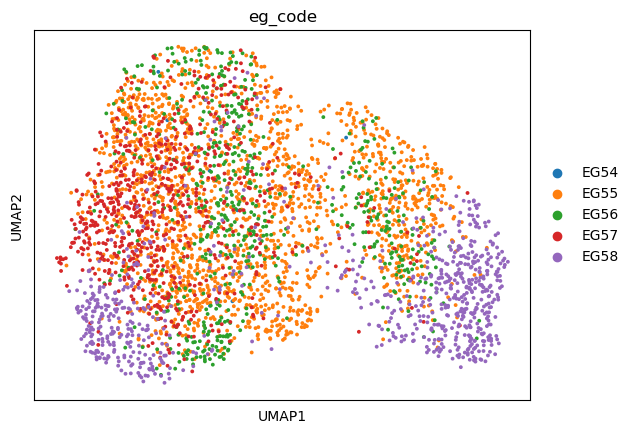

In [11]:
sc.pl.umap(adata_nk, color = ['eg_code'], color_map = 'viridis')

## Clustering by protein expression

In [12]:
adata_nk_prot = adata_nk.copy()

In [13]:
#Calculating neighbors for UMAPs

sc.pp.neighbors(adata_nk_prot, use_rep="protein_expression_dsb")    

sc.tl.umap(adata_nk_prot)

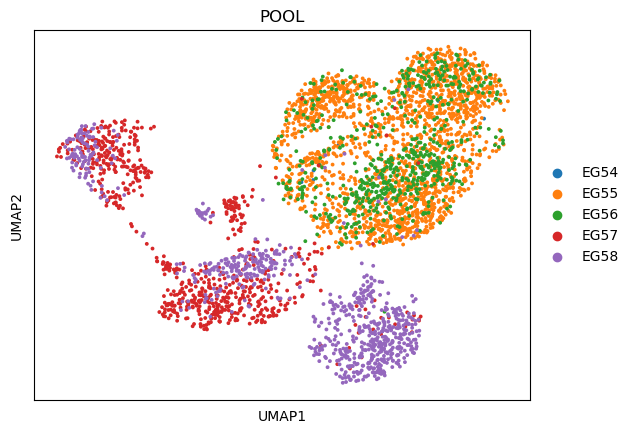

In [14]:
sc.pl.umap(adata_nk_prot, color = ['POOL'], color_map = 'viridis')

## Clustering by RNA

In [15]:
adata_nk_rna = adata_nk.copy()

In [16]:
sc.pp.pca(adata_nk_rna)

In [17]:
#calculating neighbors

sc.pp.neighbors(adata_nk_rna)

sc.tl.umap(adata_nk_rna)

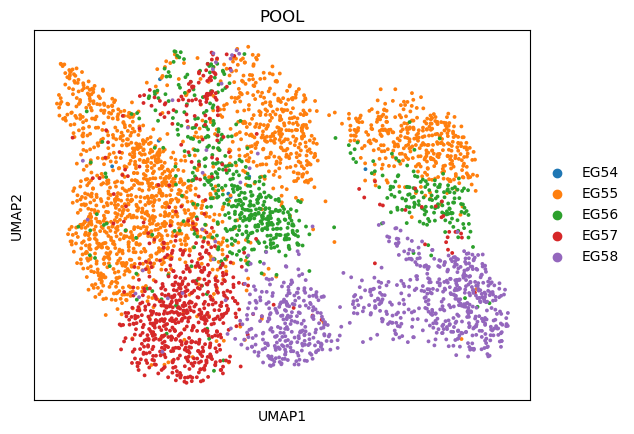

In [18]:
sc.pl.umap(adata_nk_rna, color = ['POOL'], color_map = 'viridis')

In [99]:
#Calculating leidens for latent object
sc.tl.leiden(adata_nk, resolution = 0.3, key_added = "leiden_0.3")
sc.tl.leiden(adata_nk, resolution = 0.5, key_added = "leiden_0.5")
sc.tl.leiden(adata_nk, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata_nk, resolution = 0.7, key_added = "leiden_0.7")
sc.tl.leiden(adata_nk, resolution = 0.8, key_added = "leiden_0.8")


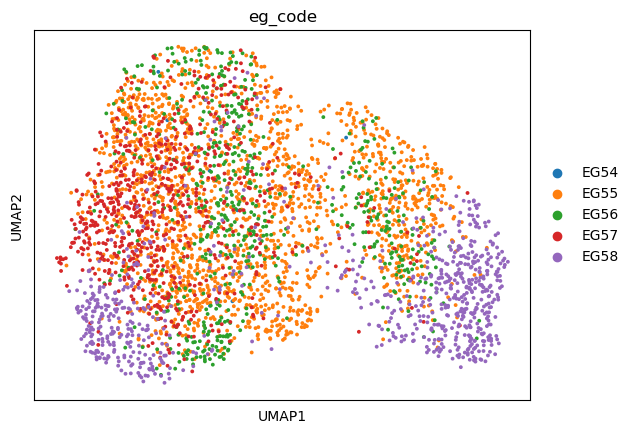

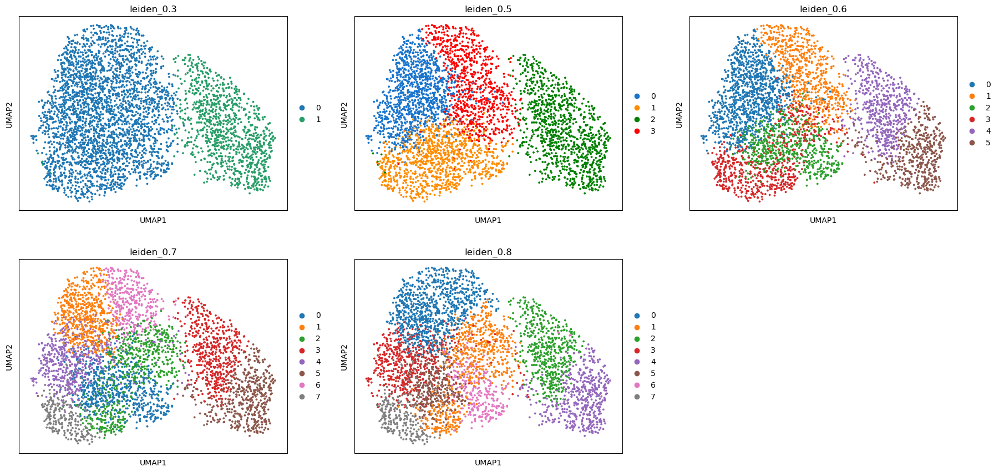

In [100]:
sc.pl.umap(adata_nk, color = ['eg_code'], color_map = 'viridis')
sc.pl.umap(adata_nk, color=['leiden_0.3', 'leiden_0.5','leiden_0.6', 'leiden_0.7', 'leiden_0.8'], ncols =3)

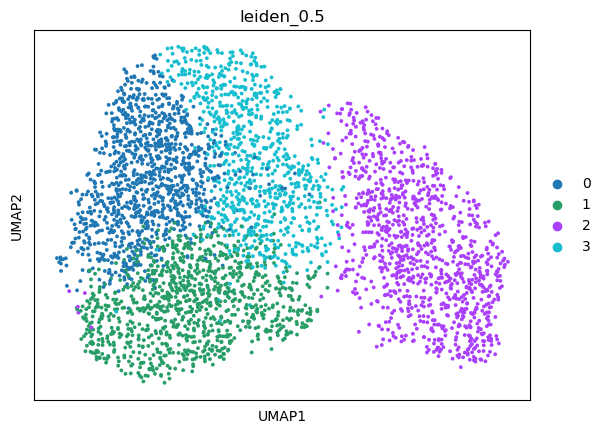

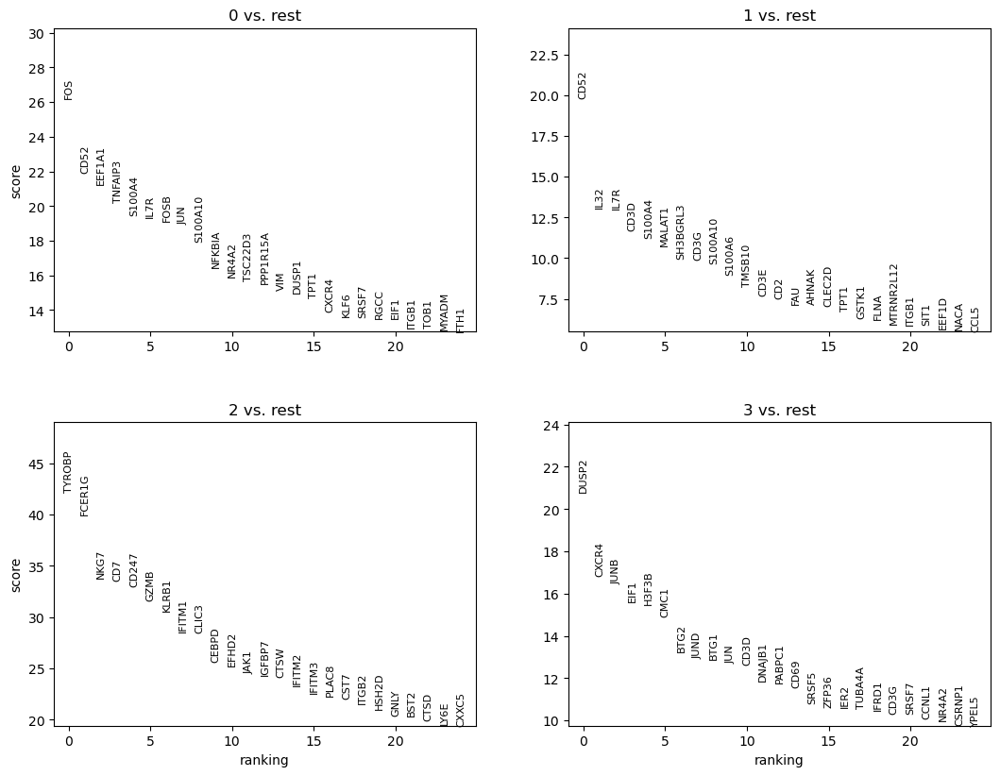

In [82]:
sc.pl.umap(adata_nk, color=['leiden_0.5'], ncols =3)

sc.tl.rank_genes_groups(adata_nk, 'leiden_0.5', method='wilcoxon')
sc.pl.rank_genes_groups(adata_nk, n_genes=25, sharey=False, ncols=2)

In [37]:
#Removing mitochondrial and ribosomal genes

#genes to be removed
mito_genes = adata_nk.var_names.str.startswith('MT-')
ribo_genes = adata_nk.var_names.str.startswith('RPL')
ribo_genes1 = adata_nk.var_names.str.startswith('RPS')

remove = np.add(mito_genes, ribo_genes)
remove = np.add(remove, ribo_genes1)

#other genes kept
keep = np.invert(remove)

adata_nk = adata_nk[:,keep]

#print(adata_gex.n_obs, adata_gex.n_vars)

In [ ]:
#New colors for clusters
cols = ['#1874CD', '#FF8C00', 'Green', 'Red']

adata_nk.uns['leiden_0.5_colors'] = cols


In [ ]:
cluster_names = [
    '0', '1',
    '2', '3']

adata_nk.rename_categories('leiden_0.5', cluster_names)

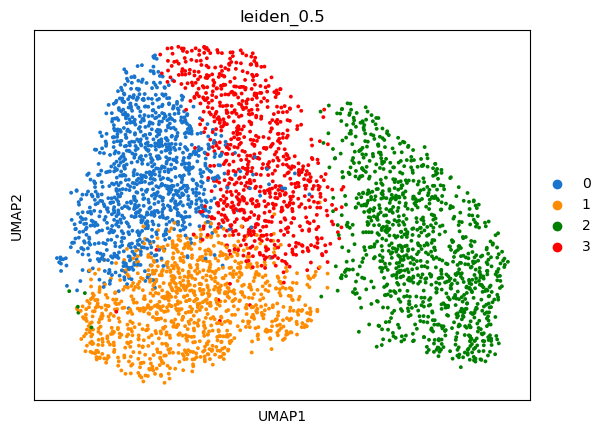

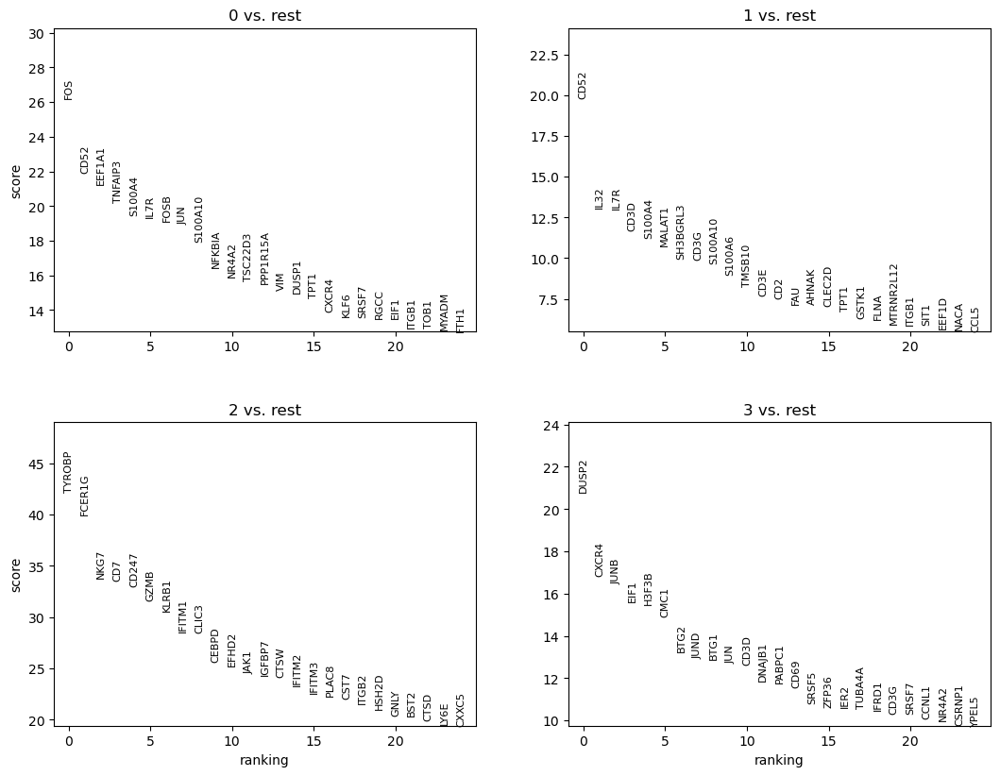

In [87]:
sc.pl.umap(adata_nk, color=['leiden_0.5'], ncols =3)

sc.tl.rank_genes_groups(adata_nk, 'leiden_0.5', method='wilcoxon')
sc.pl.rank_genes_groups(adata_nk, n_genes=25, sharey=False, ncols=2)

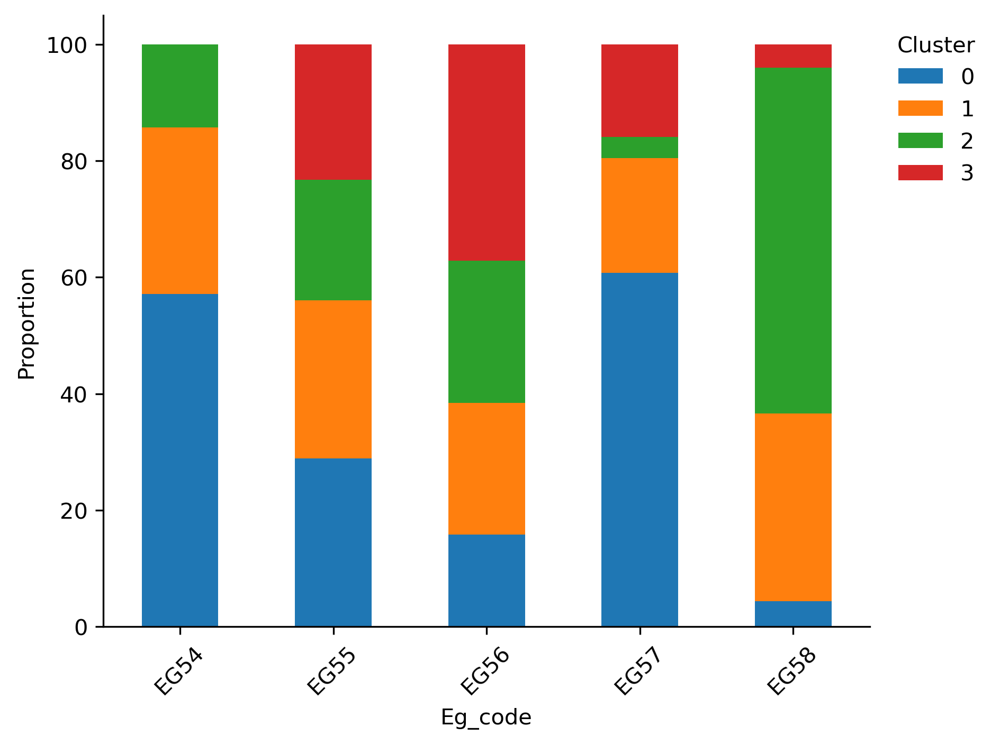

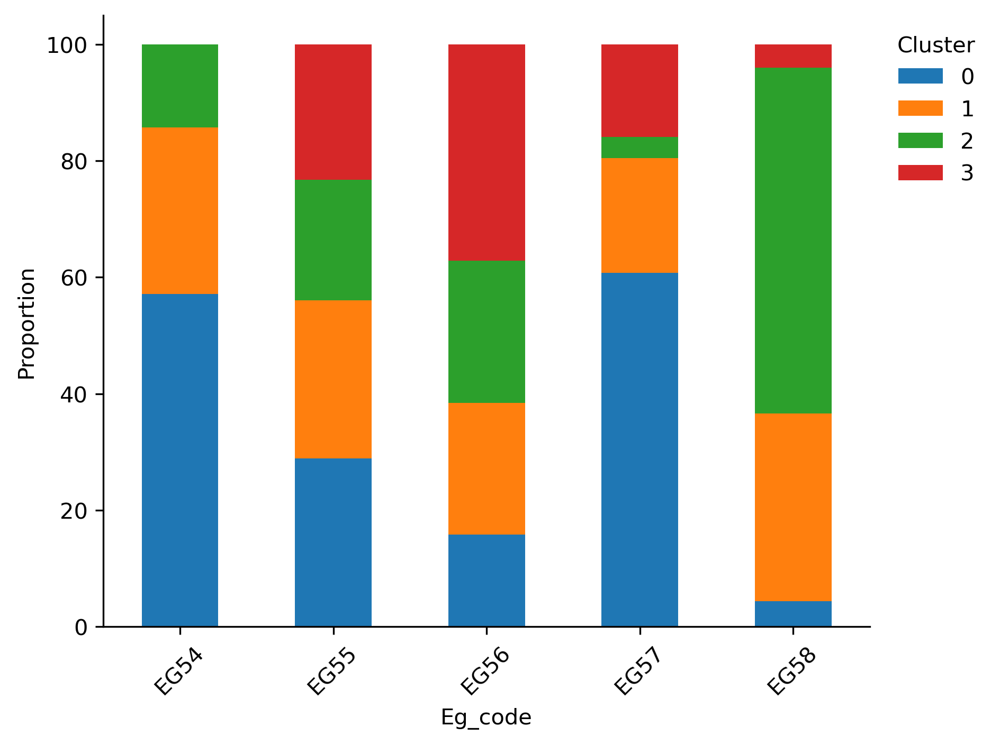

In [88]:
cluster_props = get_cluster_proportions(adata_nk,
                            cluster_key="leiden_0.5",
                            sample_key="eg_code",
                            drop_values=None)


plot_cluster_proportions(cluster_props, 
                             cluster_palette=None,
                             xlabel_rotation=45)


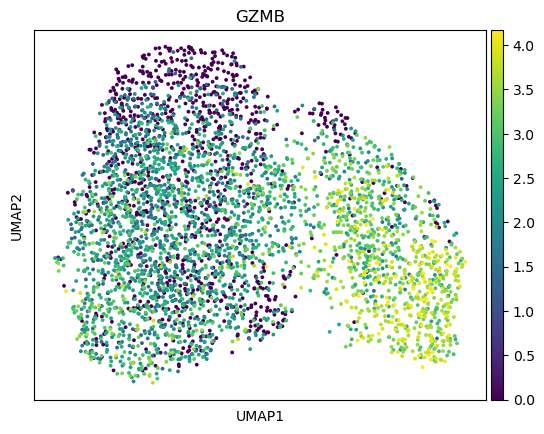

In [76]:
sc.pl.umap(adata_nk, color=['GZMB'], vmax="p99")

In [51]:
## DC56bright markers by Melsen

#Melsen et al.

cd56bright_mels = ['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R', 'KLRC1']

cd56bright_mels_prot= ['CD56',"CD2_prot", 'CD127', 'CD117'] #CD62L not found


listOfmarkers= cd56bright_mels
cd56bright_melsen = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        cd56bright_melsen.append(x)
        
    

SELL
CD2
IL7R


RNA markers


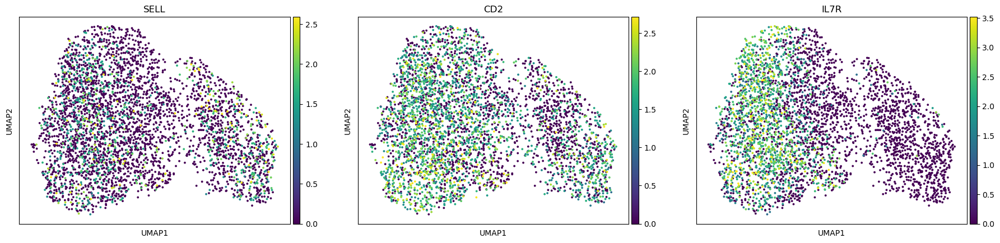

Protein markers


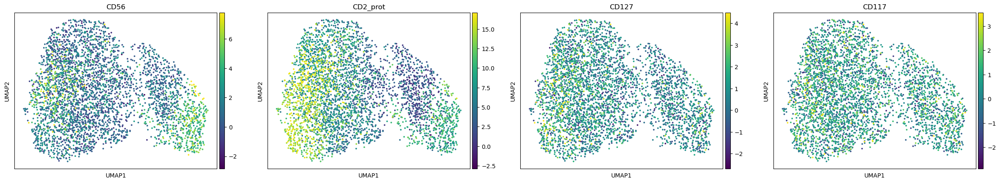

In [52]:
print("RNA markers")
sc.pl.umap(adata_nk, color=cd56bright_melsen, ncols = 3, vmax="p99")

print("Protein markers")
sc.pl.umap(adata_nk, color=cd56bright_mels_prot, vmax="p99")

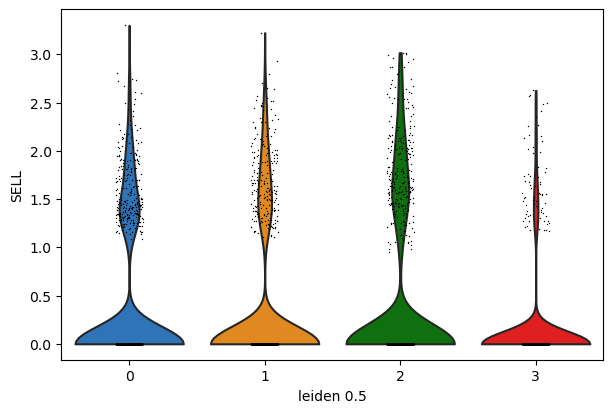

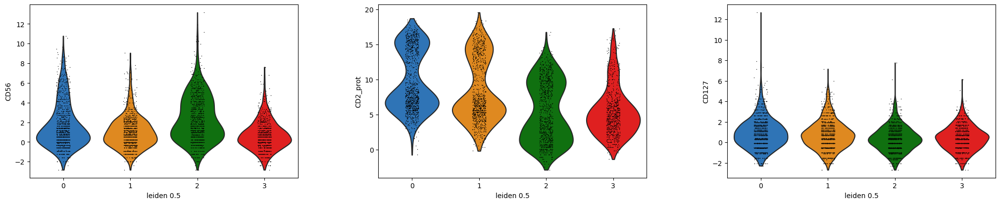

In [89]:
#CD56bright markers

sc.pl.violin(adata_nk, ['SELL'], groupby='leiden_0.5') #IL7R, GZMK not found

sc.pl.violin(adata_nk, ['CD56', 'CD2_prot', 'CD127'], groupby='leiden_0.5')

In [54]:
## Mature CD56dim by Melsen

#cluster 1

cd56dim_1= ['S100A4', 'S100A6', 'ACTB', 'ACTG1', 'CORO1A', 'PFN1']

#cluster 7 (suggested to be intermediate stage between CD56bright and CD56dim NK cells)

cd56dim_7 = ['GZMK', 'SELL'] #higher expression compared to cluster 1
cd56dim_7_prot = ['CD62L']

In [55]:
listOfmarkers= cd56dim_1
cd56dim_1_melsen = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        cd56dim_1_melsen.append(x)
        

S100A4
S100A6
ACTB
ACTG1
CORO1A
PFN1


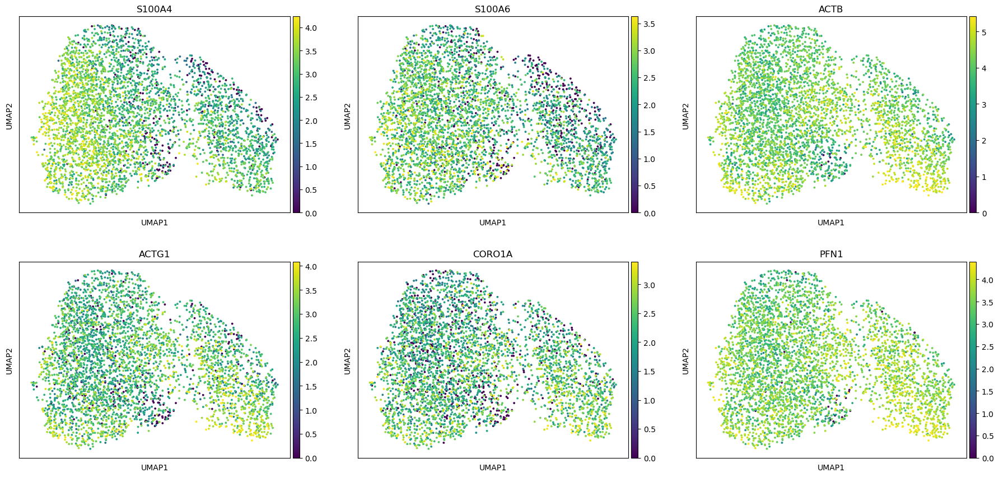

In [57]:
#Cluster 1 (more mature)
sc.pl.umap(adata_nk, color=cd56dim_1_melsen, ncols = 3, vmax="p99")

In [58]:
listOfmarkers= cd56dim_7
cd56dim_7_melsen = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        cd56dim_7_melsen.append(x)

SELL


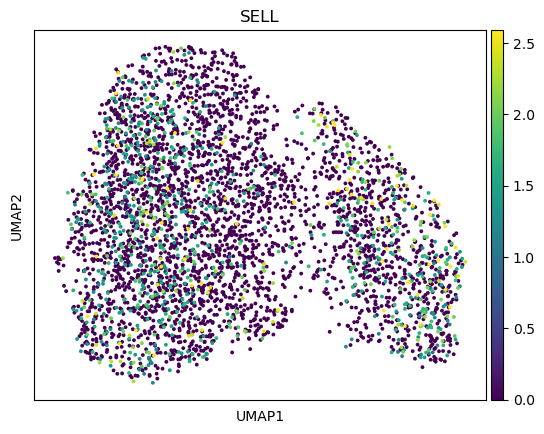

In [59]:
#Cluster 7 (transitional state)
sc.pl.umap(adata_nk, color=cd56dim_7_melsen, ncols = 3, vmax="p99")

In [60]:
## Tissue-resident NK by Melsen

tr_mels= ['CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160', 'DUSP2', 'CXCR4', 'BTG1']

listOfmarkers= tr_mels
tr_melsen = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        tr_melsen.append(x)

DUSP2
CXCR4
BTG1


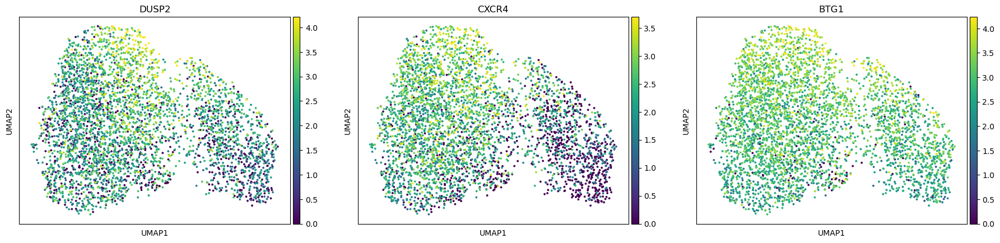

In [61]:
sc.pl.umap(adata_nk, color=tr_melsen, ncols = 3, vmax="p99")

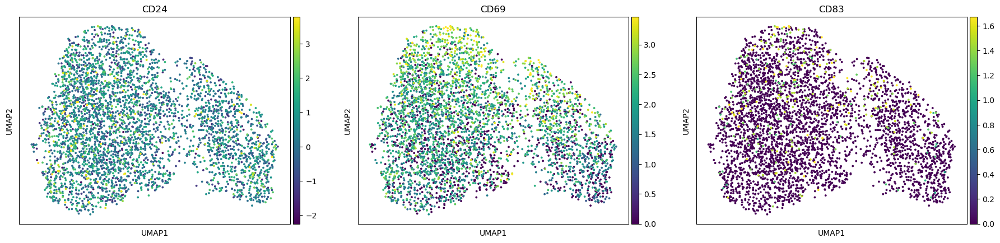

In [62]:
#tissue resident markers identified by regressors (were protein, these are RNA)

sc.pl.umap(adata_nk, color=['CD24', 'CD69', 'CD83'], ncols = 3, vmax="p99")

In [63]:
## Adaptive NK by Dufva

#Dufva et al. 

adaptive = ['LAG3', 'GZMH', 'KLRG1', 'KLRC3', 'HLA-DR', 'CD2', 'CD52', 'RHOB']


listOfmarkers= adaptive
markers_adaptive = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        markers_adaptive.append(x)

CD2
CD52
RHOB


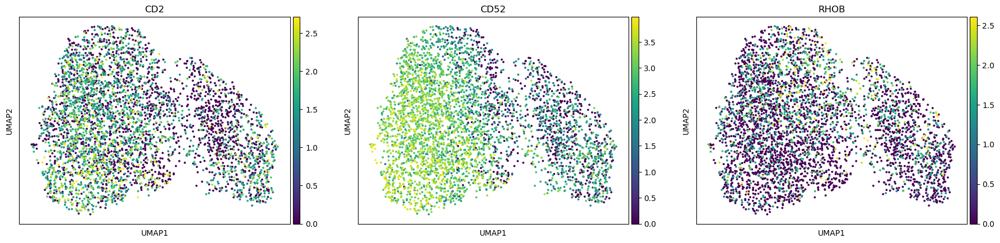

In [64]:
sc.pl.umap(adata_nk, color=markers_adaptive, ncols = 3, vmax="p99")

In [65]:
## Adaptive NK by Yang 

#Yang et al. 

adaptive2 = ['KLRC2', 'CD52', 'CD3E', 'CD3D', 'CD3G']

listOfmarkers= adaptive2
markers_adaptive_yang = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        markers_adaptive_yang.append(x)

CD52
CD3E
CD3D
CD3G


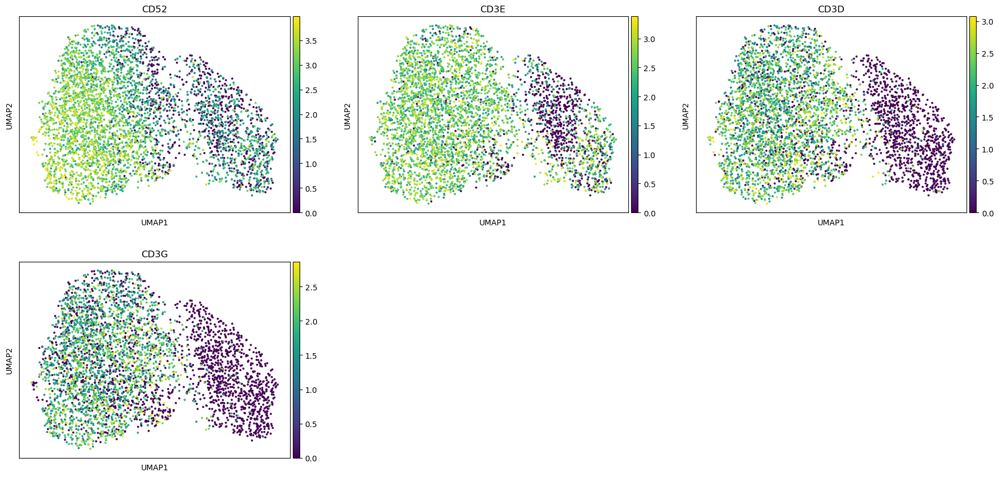

In [66]:
sc.pl.umap(adata_nk, color=markers_adaptive_yang, ncols = 3, vmax="p99")

In [69]:
## Activated NK by Yang

#Activated by Yang

activated = ['NFKBIA', 'JUN', 'JUNB', 'ZFP36', 'DOS', 'FOSB', 'DUSP1', 'NR4A2', 'CXCR4']


listOfmarkers= activated
markers_activated = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        markers_activated.append(x)

NFKBIA
JUN
JUNB
ZFP36
FOSB
DUSP1
NR4A2
CXCR4


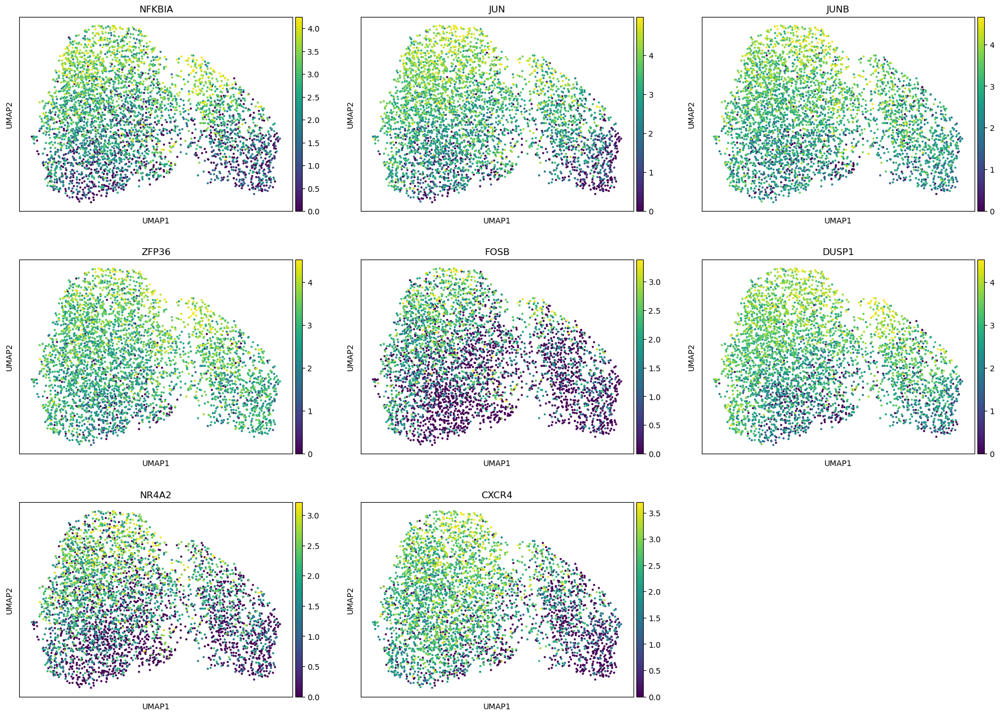

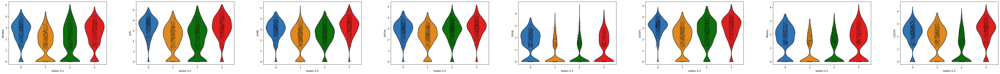

In [90]:
sc.pl.umap(adata_nk, color=markers_activated, ncols = 3, vmax="p99")

sc.pl.violin(adata_nk, markers_activated, groupby='leiden_0.5')

In [72]:
## Mature NK by Yang

#by Yang et al. 

mature = ['B3GAT1', 'PRF1', 'GZMA', 'GZMB', 'GZMH', 'ACTB', 'ARPC2', 'CORO1A', 'CFL1', 'CST7', 'PFN1', 'ANXA1']

listOfmarkers= mature
markers_mature = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        markers_mature.append(x)

GZMA
GZMB
ACTB
ARPC2
CORO1A
CFL1
CST7
PFN1
ANXA1


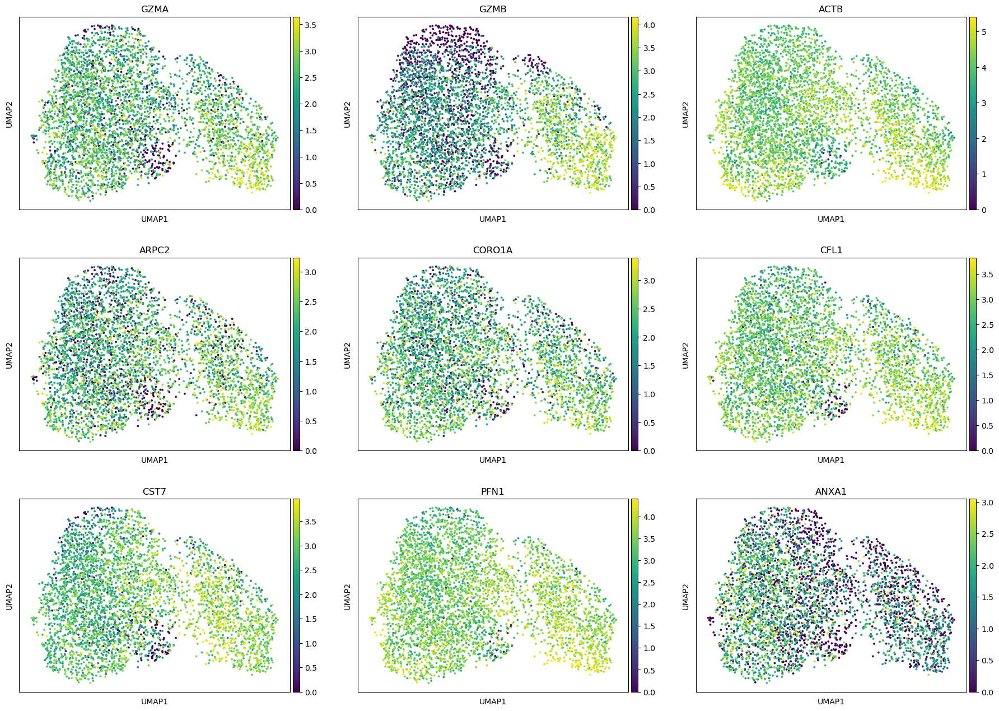

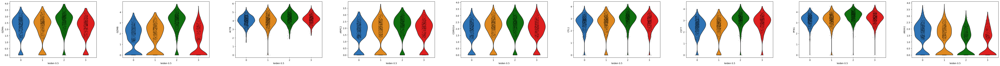

In [92]:
sc.pl.umap(adata_nk, color=markers_mature, ncols = 3, vmax="p99")

sc.pl.violin(adata_nk, markers_mature, groupby='leiden_0.5')

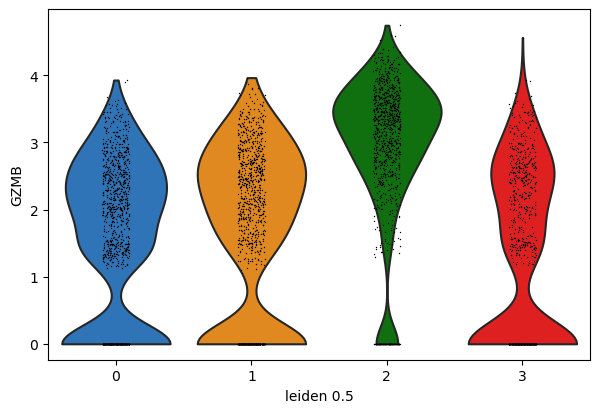

In [93]:
sc.pl.violin(adata_nk, ['GZMB'], groupby='leiden_0.5')

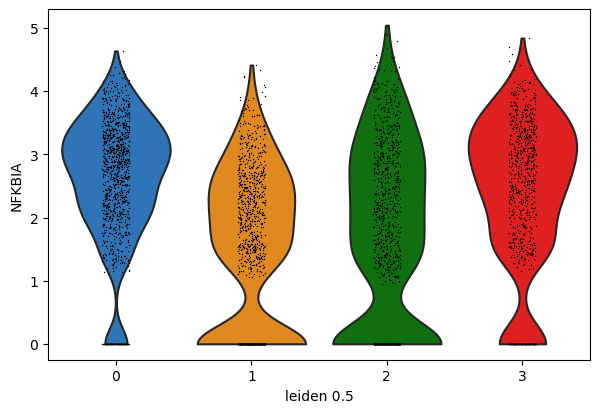

In [95]:
sc.pl.violin(adata_nk, ['NFKBIA'], groupby='leiden_0.5')

In [74]:
## Terminal markers Yang et al.

#by Yang et al. 

terminal = ['ZEB2', 'CX3CR1', 'HAVCR2'] 

listOfmarkers= terminal
markers_terminal = []

for x in listOfmarkers:
    if x in adata_nk.var_names:
        print(x)
        markers_terminal.append(x)

ZEB2


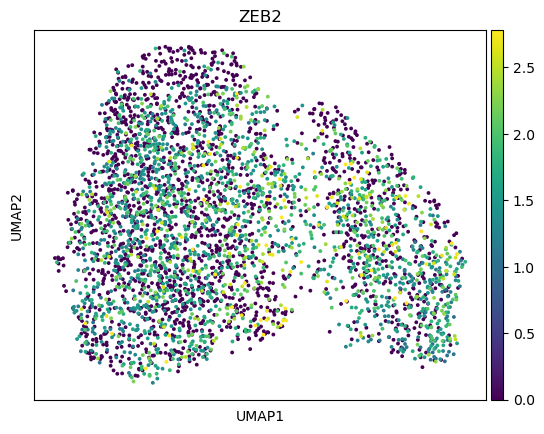

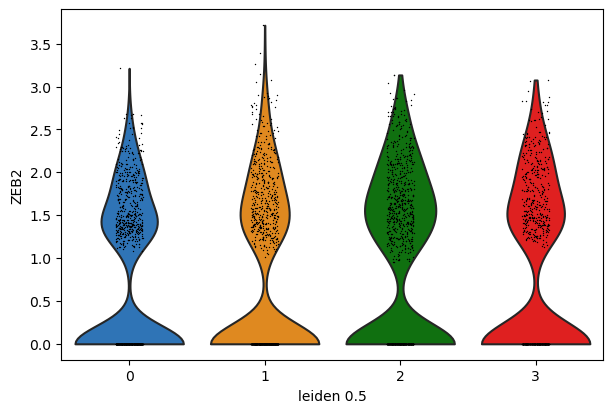

In [91]:
sc.pl.umap(adata_nk, color=markers_terminal, ncols = 3, vmax="p99")

sc.pl.violin(adata_nk, markers_terminal, groupby='leiden_0.5')